## Problem Statement

 ### You are working as a data scientist in a global finance company.
 ### Over the years, the company has collected basic bank details and gathered a lot of credit-related information.
 ### The management wants to build an intelligent system to segregate the people into credit score brackets to reduce the manual efforts.

## Feature Info

- ID Represents a unique identification of an entry

- Customer_ID Represents a unique identification of a person

- Month Represents the month of the year

- Name Represents the name of a person

- Age Represents the age of the person

- SSN Represents the social security number of a person

- Occupation Represents the occupation of the person

- Annual_Income Represents the annual income of the person

- Monthly_Inhand_Salary Represents the monthly base salary of a person

- Num_Bank_Accounts Represents the number of bank accounts a person holds

- Num_Credit_Card Represents the number of other credit cards held by a person

- Interest_Rate Represents the interest rate on credit card

- Num_of_Loan Represents the number of loans taken from the bank

- Type_of_Loan Represents the types of loan taken by a person

- Delay_from_due_date Represents the average number of days delayed from the payment date

- Num_of_Delayed_Payment Represents the average number of payments delayed by a person

- Changed_Credit_Limit Represents the percentage change in credit card limit

- Num_Credit_Inquiries Represents the number of credit card inquiries

- Credit_Mix Represents the classification of the mix of credits

- Outstanding_Debt Represents the remaining debt to be paid (in USD)

- Credit_Utilization_Ratio Represents the utilization ratio of credit card

- Credit_History_Age Represents the age of credit history of the person

- Payment_of_Min_Amount Represents whether only the minimum amount was paid by the person

- Total_EMI_per_month Represents the monthly EMI payments (in USD)

- Amount_invested_monthly Represents the monthly amount invested by the customer (in USD)

- Payment_Behaviour Represents the payment behavior of the customer (in USD)

- Monthly_Balance Represents the monthly balance amount of the customer (in USD)

- Credit_Score Represents the bracket of credit score (Poor, Standard, Good)

## Import

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import plotly.express as px
from sklearn.preprocessing import LabelEncoder,StandardScaler,Normalizer
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from imblearn.over_sampling import SMOTE
from tensorflow.keras.optimizers import Adam

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,cross_val_score,KFold,GridSearchCV
from sklearn.metrics import confusion_matrix,classification_report



## Reading and Understanding the Data

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
df=pd.read_csv("/content/drive/MyDrive/train.csv")

<ipython-input-4-e34d7e359f9b>:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("/content/drive/MyDrive/train.csv")


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,84998.0,4194.170850,3183.686167,303.645417,1625.568229,3093.745000,5957.448333,15204.633333
Num_Bank_Accounts,100000.0,17.091280,117.404834,-1.000000,3.000000,6.000000,7.000000,1798.000000
Num_Credit_Card,100000.0,22.474430,129.057410,0.000000,4.000000,5.000000,7.000000,1499.000000
Interest_Rate,100000.0,72.466040,466.422621,1.000000,8.000000,13.000000,20.000000,5797.000000
Delay_from_due_date,100000.0,21.068780,14.860104,-5.000000,10.000000,18.000000,28.000000,67.000000
Num_Credit_Inquiries,98035.0,27.754251,193.177339,0.000000,3.000000,6.000000,9.000000,2597.000000
Credit_Utilization_Ratio,100000.0,32.285173,5.116875,20.000000,28.052567,32.305784,36.496663,50.000000
Total_EMI_per_month,100000.0,1403.118217,8306.041270,0.000000,30.306660,69.249473,161.224249,82331.000000


### Remove unecessary features to our problem

In [7]:
df.drop(columns=["ID","Name","SSN"],inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Customer_ID               100000 non-null  object 
 1   Month                     100000 non-null  object 
 2   Age                       100000 non-null  object 
 3   Occupation                100000 non-null  object 
 4   Annual_Income             100000 non-null  object 
 5   Monthly_Inhand_Salary     84998 non-null   float64
 6   Num_Bank_Accounts         100000 non-null  int64  
 7   Num_Credit_Card           100000 non-null  int64  
 8   Interest_Rate             100000 non-null  int64  
 9   Num_of_Loan               100000 non-null  object 
 10  Type_of_Loan              88592 non-null   object 
 11  Delay_from_due_date       100000 non-null  int64  
 12  Num_of_Delayed_Payment    92998 non-null   object 
 13  Changed_Credit_Limit      100000 non-null  ob

### Null Values

In [8]:
df.isnull().mean()*100

Customer_ID                  0.000
Month                        0.000
Age                          0.000
Occupation                   0.000
Annual_Income                0.000
Monthly_Inhand_Salary       15.002
Num_Bank_Accounts            0.000
Num_Credit_Card              0.000
Interest_Rate                0.000
Num_of_Loan                  0.000
Type_of_Loan                11.408
Delay_from_due_date          0.000
Num_of_Delayed_Payment       7.002
Changed_Credit_Limit         0.000
Num_Credit_Inquiries         1.965
Credit_Mix                   0.000
Outstanding_Debt             0.000
Credit_Utilization_Ratio     0.000
Credit_History_Age           9.030
Payment_of_Min_Amount        0.000
Total_EMI_per_month          0.000
Amount_invested_monthly      4.479
Payment_Behaviour            0.000
Monthly_Balance              1.200
Credit_Score                 0.000
dtype: float64

In [9]:
for column in df.columns:
    print(column)
    print(df[column].value_counts(dropna=False))
    print("------------------------------------")

Customer_ID
CUS_0xd40     8
CUS_0x9bf4    8
CUS_0x5ae3    8
CUS_0xbe9a    8
CUS_0x4874    8
             ..
CUS_0x2eb4    8
CUS_0x7863    8
CUS_0x9d89    8
CUS_0xc045    8
CUS_0x942c    8
Name: Customer_ID, Length: 12500, dtype: int64
------------------------------------
Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: Month, dtype: int64
------------------------------------
Age
38      2833
28      2829
31      2806
26      2792
32      2749
        ... 
471        1
1520       1
8663       1
3363       1
1342       1
Name: Age, Length: 1788, dtype: int64
------------------------------------
Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6

###  The data needs alot of work and cleaning
### Problems Noticed:
- ####     Null Values
- ####     Wrong data types
- ####     Type of Loans column needs to be divided to separate columns
- ####     Illogical values for alot of features
- ####     Distribution of our Target Variable is not balanced


In [10]:
categorical_columns=["Customer_ID",'Month', 'Occupation','Type_of_Loan','Payment_Behaviour','Credit_Score','Payment_of_Min_Amount',"Credit_Mix"]

numerical_columns=list(set(df.columns)-set(categorical_columns))

display(numerical_columns)

['Monthly_Balance',
 'Total_EMI_per_month',
 'Interest_Rate',
 'Annual_Income',
 'Age',
 'Monthly_Inhand_Salary',
 'Credit_History_Age',
 'Outstanding_Debt',
 'Amount_invested_monthly',
 'Changed_Credit_Limit',
 'Delay_from_due_date',
 'Credit_Utilization_Ratio',
 'Num_of_Loan',
 'Num_Bank_Accounts',
 'Num_Credit_Inquiries',
 'Num_of_Delayed_Payment',
 'Num_Credit_Card']

## Let's fix Categorical Feature


### Occupation

In [11]:
df.Occupation.value_counts()

_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

#### We will deal with _____ as null values

In [12]:
df[df.Occupation=="_______"]["Customer_ID"].value_counts()

CUS_0x9e67    5
CUS_0x684a    4
CUS_0x2c54    4
CUS_0x3243    4
CUS_0xc715    4
             ..
CUS_0xc393    1
CUS_0x2e19    1
CUS_0xb8eb    1
CUS_0x7c01    1
CUS_0x8600    1
Name: Customer_ID, Length: 5550, dtype: int64

#### Checking if there is a pattern that causes occupation to be equal '_______'

In [13]:
cID="CUS_0x684a"
display(
df[(df["Customer_ID"]==cID) & (df.Occupation=="_______")].describe().T,
df[(df["Customer_ID"]==cID) & (df.Occupation!="_______")].describe().T
)

,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,3.0,6768.893333,0.000000,6768.893333,6768.893333,6768.893333,6768.893333,6768.893333
Num_Bank_Accounts,4.0,9.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000
Num_Credit_Card,4.0,345.250000,674.500000,8.000000,8.000000,8.000000,345.250000,1357.000000
Interest_Rate,4.0,22.000000,0.000000,22.000000,22.000000,22.000000,22.000000,22.000000
Delay_from_due_date,4.0,50.500000,1.000000,50.000000,50.000000,50.000000,50.500000,52.000000
Num_Credit_Inquiries,4.0,13.250000,2.500000,12.000000,12.000000,12.000000,13.250000,17.000000
Credit_Utilization_Ratio,4.0,35.354134,6.060371,26.550801,33.774032,37.605828,39.185930,39.654078
Total_EMI_per_month,4.0,208.755394,0.000000,208.755394,208.755394,208.755394,208.755394,208.755394


,count,mean,std,min,25%,50%,75%,max
Monthly_Inhand_Salary,4.0,6768.893333,0.000000,6768.893333,6768.893333,6768.893333,6768.893333,6768.893333
Num_Bank_Accounts,4.0,9.000000,0.000000,9.000000,9.000000,9.000000,9.000000,9.000000
Num_Credit_Card,4.0,300.250000,584.500000,8.000000,8.000000,8.000000,300.250000,1177.000000
Interest_Rate,4.0,22.000000,0.000000,22.000000,22.000000,22.000000,22.000000,22.000000
Delay_from_due_date,4.0,51.000000,2.000000,50.000000,50.000000,50.000000,51.000000,54.000000
Num_Credit_Inquiries,4.0,13.250000,2.500000,12.000000,12.000000,12.000000,13.250000,17.000000
Credit_Utilization_Ratio,4.0,35.036362,2.472668,31.441964,34.397925,35.961403,36.599840,36.780676
Total_EMI_per_month,4.0,208.755394,0.000000,208.755394,208.755394,208.755394,208.755394,208.755394


#### We can replace _______ with the mode Occupatin of the Customer from other Months

In [14]:
df.Occupation.replace('_______',np.NAN,inplace=True) # Making it Nan is much easier to deal with and more efficient
df.Occupation=df.groupby("Customer_ID")["Occupation"].apply(lambda customer: customer.fillna(customer.mode()[0]))
display(
    df.Occupation.value_counts(dropna=False),
    df.Occupation.isnull().sum()
)


<ipython-input-14-ec4ec3b216a7>:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df.Occupation=df.groupby("Customer_ID")["Occupation"].apply(lambda customer: customer.fillna(customer.mode()[0]))


Lawyer           7096
Engineer         6864
Architect        6824
Mechanic         6776
Scientist        6744
Accountant       6744
Developer        6720
Media_Manager    6720
Teacher          6672
Entrepreneur     6648
Doctor           6568
Journalist       6536
Manager          6432
Musician         6352
Writer           6304
Name: Occupation, dtype: int64

0

### Type of Loan

In [15]:
df.Type_of_Loan.value_counts(dropna=False)

NaN                                                                                                                                   11408
Not Specified                                                                                                                          1408
Credit-Builder Loan                                                                                                                    1280
Personal Loan                                                                                                                          1272
Debt Consolidation Loan                                                                                                                1264
                                                                                                                                      ...  
Not Specified, Mortgage Loan, Auto Loan, and Payday Loan                                                                                  8
Payday Loan, Mortgag

#### Check if the null values are supposed not specified or another value

In [16]:
df[df.Type_of_Loan.isnull()]["Customer_ID"].value_counts()

CUS_0x1cdb    8
CUS_0xc4bb    8
CUS_0x2dd8    8
CUS_0x2ccc    8
CUS_0xc2a6    8
             ..
CUS_0x85e7    8
CUS_0x26fd    8
CUS_0x6a5f    8
CUS_0x6203    8
CUS_0xad4f    8
Name: Customer_ID, Length: 1426, dtype: int64

### We will make each type of loan a new boolean column

In [17]:
types_loan=df.Type_of_Loan.value_counts()[:9].index[1:]
types_loan

Index(['Credit-Builder Loan', 'Personal Loan', 'Debt Consolidation Loan',
       'Student Loan', 'Payday Loan', 'Mortgage Loan', 'Auto Loan',
       'Home Equity Loan'],
      dtype='object')

In [18]:
for loan in types_loan:
    df[loan]=df.Type_of_Loan.str.contains(loan)
df.drop(columns="Type_of_Loan",inplace=True)
df.head()

,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,...,Monthly_Balance,Credit_Score,Credit-Builder Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Payday Loan,Mortgage Loan,Auto Loan,Home Equity Loan
0,CUS_0xd40,January,23,Scientist,19114.12,1824.843333,3,4,3,4,...,312.49408867943663,Good,True,True,False,False,False,False,True,True
1,CUS_0xd40,February,23,Scientist,19114.12,NaN,3,4,3,4,...,284.62916249607184,Good,True,True,False,False,False,False,True,True
2,CUS_0xd40,March,-500,Scientist,19114.12,NaN,3,4,3,4,...,331.2098628537912,Good,True,True,False,False,False,False,True,True
3,CUS_0xd40,April,23,Scientist,19114.12,NaN,3,4,3,4,...,223.45130972736786,Good,True,True,False,False,False,False,True,True
4,CUS_0xd40,May,23,Scientist,19114.12,1824.843333,3,4,3,4,...,341.48923103222177,Good,True,True,False,False,False,False,True,True


### Payment Behaviour

In [19]:
display(df.Payment_Behaviour.value_counts(dropna=False))
df.Payment_Behaviour.replace('!@9#%8',np.NaN,inplace=True)
df[df.Payment_Behaviour.isnull()]["Customer_ID"].value_counts()

Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: Payment_Behaviour, dtype: int64

CUS_0xaca7    5
CUS_0xb648    5
CUS_0x9b6b    4
CUS_0xa848    4
CUS_0x943c    4
             ..
CUS_0x87c9    1
CUS_0x4dff    1
CUS_0x84c     1
CUS_0x784     1
CUS_0x942c    1
Name: Customer_ID, Length: 5900, dtype: int64

### Credit Mix

In [20]:
df.Credit_Mix.value_counts()

Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64

In [21]:
df.Credit_Mix.replace("_",np.NaN,inplace=True)
df.Credit_Mix=df.groupby("Customer_ID")["Credit_Mix"].apply(lambda customer: customer.fillna(customer.mode()[0]))
df.Credit_Mix.value_counts()

<ipython-input-21-f6ae1f9713cc>:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df.Credit_Mix=df.groupby("Customer_ID")["Credit_Mix"].apply(lambda customer: customer.fillna(customer.mode()[0]))


Standard    45848
Good        30384
Bad         23768
Name: Credit_Mix, dtype: int64

## Numerical Features

In [22]:
numerical_columns

['Monthly_Balance',
 'Total_EMI_per_month',
 'Interest_Rate',
 'Annual_Income',
 'Age',
 'Monthly_Inhand_Salary',
 'Credit_History_Age',
 'Outstanding_Debt',
 'Amount_invested_monthly',
 'Changed_Credit_Limit',
 'Delay_from_due_date',
 'Credit_Utilization_Ratio',
 'Num_of_Loan',
 'Num_Bank_Accounts',
 'Num_Credit_Inquiries',
 'Num_of_Delayed_Payment',
 'Num_Credit_Card']

### Amount Invested Monthly

In [23]:
df.Amount_invested_monthly.value_counts()

__10000__             4305
0.0                    169
80.41529543900253        1
36.66235139442514        1
89.7384893604547         1
                      ... 
36.541908593249026       1
93.45116318631192        1
140.80972223052834       1
38.73937670100975        1
167.1638651610451        1
Name: Amount_invested_monthly, Length: 91049, dtype: int64

In [24]:
for feature in numerical_columns:
    try:
        df[feature]=df[feature].str.replace("_","")
        df[feature]=df[feature].astype("float")
    except:
        print(feature)

Total_EMI_per_month
Interest_Rate
Monthly_Inhand_Salary
Credit_History_Age
Changed_Credit_Limit
Delay_from_due_date
Credit_Utilization_Ratio
Num_Bank_Accounts
Num_Credit_Inquiries
Num_Credit_Card


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Customer_ID               100000 non-null  object 
 1   Month                     100000 non-null  object 
 2   Age                       100000 non-null  float64
 3   Occupation                100000 non-null  object 
 4   Annual_Income             100000 non-null  float64
 5   Monthly_Inhand_Salary     84998 non-null   float64
 6   Num_Bank_Accounts         100000 non-null  int64  
 7   Num_Credit_Card           100000 non-null  int64  
 8   Interest_Rate             100000 non-null  int64  
 9   Num_of_Loan               100000 non-null  float64
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   float64
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

### Changed Credit Limit

In [26]:
df.Changed_Credit_Limit=df.Changed_Credit_Limit.replace("",np.NAN)
df.Changed_Credit_Limit=df.Changed_Credit_Limit.astype("float")
df.Changed_Credit_Limit.value_counts(dropna=False)

 NaN      2091
 8.22      133
 11.50     127
 11.32     126
 7.35      121
          ... 
-1.84        1
 0.89        1
 28.06       1
 1.56        1
 21.17       1
Name: Changed_Credit_Limit, Length: 4384, dtype: int64

In [27]:
df.Credit_Mix=df.groupby("Customer_ID")["Changed_Credit_Limit"].apply(lambda customer: customer.fillna(customer.median()))

<ipython-input-27-352ed8b8277e>:1: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df.Credit_Mix=df.groupby("Customer_ID")["Changed_Credit_Limit"].apply(lambda customer: customer.fillna(customer.median()))


### Rest of features containing null values

#### We can fill null values by na by the mean of values of the current customer

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Customer_ID               100000 non-null  object 
 1   Month                     100000 non-null  object 
 2   Age                       100000 non-null  float64
 3   Occupation                100000 non-null  object 
 4   Annual_Income             100000 non-null  float64
 5   Monthly_Inhand_Salary     84998 non-null   float64
 6   Num_Bank_Accounts         100000 non-null  int64  
 7   Num_Credit_Card           100000 non-null  int64  
 8   Interest_Rate             100000 non-null  int64  
 9   Num_of_Loan               100000 non-null  float64
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   float64
 12  Changed_Credit_Limit      97909 non-null   float64
 13  Num_Credit_Inquiries      98035 non-null   fl

In [29]:
null_columns = df.isnull().sum()

# Get the column names with null values
columns_with_null = null_columns[null_columns > 0].index.tolist()

for feature in columns_with_null:
  if df[feature].dtype!="O":
    df[feature]=df.groupby("Customer_ID",group_keys=False)[feature].apply(lambda customer: customer.fillna(customer.mean()))
  else:
    df[feature]=df.groupby("Customer_ID",group_keys=False)[feature].apply(lambda customer: customer.fillna(customer.mode()))

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Customer_ID               100000 non-null  object 
 1   Month                     100000 non-null  object 
 2   Age                       100000 non-null  float64
 3   Occupation                100000 non-null  object 
 4   Annual_Income             100000 non-null  float64
 5   Monthly_Inhand_Salary     100000 non-null  float64
 6   Num_Bank_Accounts         100000 non-null  int64  
 7   Num_Credit_Card           100000 non-null  int64  
 8   Interest_Rate             100000 non-null  int64  
 9   Num_of_Loan               100000 non-null  float64
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  float64
 13  Num_Credit_Inquiries      100000 non-null  fl

In [31]:
df.Credit_History_Age.value_counts()

15 Years and 11 Months    446
19 Years and 4 Months     445
19 Years and 5 Months     444
17 Years and 11 Months    443
19 Years and 3 Months     441
                         ... 
0 Years and 3 Months       20
0 Years and 2 Months       15
33 Years and 7 Months      14
33 Years and 8 Months      12
0 Years and 1 Months        2
Name: Credit_History_Age, Length: 404, dtype: int64

In [32]:
def age(hist):
    try:
        date=hist.split(",")
        return int(date[0])*12+int(date[1])
    except:
        return np.nan
df.Credit_History_Age=df.Credit_History_Age.str.replace(" Years and ",",")
df.Credit_History_Age=df.Credit_History_Age.str.replace(" Months","")

df.Credit_History_Age=df.Credit_History_Age.apply(age)

In [33]:
df.Credit_History_Age.value_counts(dropna=False)

NaN      9029
191.0     446
232.0     445
233.0     444
215.0     443
         ... 
3.0        20
2.0        15
403.0      14
404.0      12
1.0         2
Name: Credit_History_Age, Length: 405, dtype: int64

### Some columns still have null values meaning that the customer had the entire column filled by null so we will fillna by median\mode

In [34]:
null_columns = df.isnull().sum()

# Get the column names with null values
columns_with_null = null_columns[null_columns > 0].index.tolist()

for feature in columns_with_null:
  if df[feature].dtype!="O":
    df[feature].fillna(df[feature].median(),inplace=True)
  else:
    df[feature].fillna(df[feature].mode()[0],inplace=True)


## Visualizations

In [35]:
px.histogram(df,x='Credit_Score',template="plotly_dark",title="<b>Distributions of Credit Score (Target Feature)")

- #### Our Dataset is imbalanced

In [36]:
px.histogram(df,x='Month',template="plotly_dark",title="<b>Distributions of Month Feature")

- #### Months are uniformly distributed

In [37]:
px.histogram(df,x='Occupation' ,color="Credit_Score",template="plotly_dark",title="<b>Distributions of Occupation Feature")

- #### Distribution of Occupation Feature is almost uniform
- #### Distribution of each Credit Score relative to each occupation is also almost uniform

In [38]:
px.box(df,x="Credit_Score",y="Annual_Income",template="plotly_dark",title="<b>Distribution for Annual Income for each Credit Score")

- #### Annual Income is full of outliers

In [39]:
px.box(df,x="Credit_Score",y="Monthly_Inhand_Salary",color='Credit_Score',template="plotly_dark",title="<b>Distribution for Monthly Income for each Credit Score")


In [40]:
px.histogram(df,x='Monthly_Inhand_Salary',color='Credit_Score',title="<b>Distributions of Monthly Inhand Salary",template="plotly_dark",)


- ### Good Credit Score ditributions have no outliers while Standard has some and Poor has too many.
- ### Median value are increase as the Credit Score gets better

In [41]:
px.histogram(df,x='Credit_Mix', color="Credit_Score",template="plotly_dark",title="<b>Distributions of Credit Mix")

- #### There is a high correlation between Credit Score and Credit Mix

In [42]:
px.histogram(df,x='Payment_of_Min_Amount', color="Credit_Score",template="plotly_dark",title="<b>Distribution of Payment of Min Amount")

- ### More than 50% of samples have paid minimum amount
- ### More samples of Poor Credit Score have paid min amount than samples who have not paid, Opposite to Good Credit Score where more people have not paid min amount than people who have paid

### Preprocessing

#### Fix Outliers, Remove illogical data

In [43]:
df.describe().apply(lambda s: s.apply('{0:.5f}'.format)).T

,count,mean,std,min,25%,50%,75%,max
Age,100000.00000,110.64970,686.24472,-500.00000,24.00000,33.00000,42.00000,8698.00000
Annual_Income,100000.00000,176415.70130,1429618.05141,7005.93000,19457.50000,37578.61000,72790.92000,24198062.00000
Monthly_Inhand_Salary,100000.00000,4198.46857,3187.36988,303.64542,1626.59417,3096.37833,5961.63750,15204.63333
Num_Bank_Accounts,100000.00000,17.09128,117.40483,-1.00000,3.00000,6.00000,7.00000,1798.00000
Num_Credit_Card,100000.00000,22.47443,129.05741,0.00000,4.00000,5.00000,7.00000,1499.00000
Interest_Rate,100000.00000,72.46604,466.42262,1.00000,8.00000,13.00000,20.00000,5797.00000
Num_of_Loan,100000.00000,3.00996,62.64788,-100.00000,1.00000,3.00000,5.00000,1496.00000
Delay_from_due_date,100000.00000,21.06878,14.86010,-5.00000,10.00000,18.00000,28.00000,67.00000
Num_of_Delayed_Payment,100000.00000,30.89127,219.23670,-3.00000,9.00000,14.00000,18.00000,4397.00000
Changed_Credit_Limit,100000.00000,10.38854,6.78410,-6.49000,5.34000,9.40000,14.85000,36.97000


In [44]:
%pip install datasist

In [45]:
from datasist.structdata import detect_outliers
numericals = df.select_dtypes(exclude='object').columns
manual=["Age","Monthly_Balance"]
numericals=list(set(numericals)-set(manual))

for col in numericals:
  try:
    outliers_indices = detect_outliers(df,0,[col])
    print(outliers_indices)
    median = df[col].median()
    df.loc[outliers_indices, col] = median
  except:
    print(col)
df.describe().apply(lambda s: s.apply('{0:.5f}'.format)).T

Personal Loan
[]
[584, 585, 586, 587, 588, 589, 590, 591, 633, 682, 1300, 1478, 2136, 2137, 2138, 2139, 2140, 2141, 2142, 2143, 2473, 2898, 2899, 2976, 3046, 3759, 4320, 4321, 4323, 4324, 4326, 4327, 4773, 4774, 4814, 5112, 5409, 5843, 5848, 6161, 6224, 6225, 6226, 6230, 6231, 6937, 6943, 7819, 8028, 8334, 8812, 9529, 9617, 9619, 9621, 9831, 9852, 10099, 10448, 10449, 10450, 10451, 10452, 10453, 10454, 10455, 10476, 10477, 10714, 11520, 12157, 13053, 13054, 13454, 13657, 13658, 13659, 13660, 13661, 13662, 13663, 13955, 14001, 14003, 14667, 14752, 14753, 14754, 14755, 14756, 14757, 14758, 14759, 14824, 14825, 14827, 14828, 14829, 14830, 14831, 15037, 15212, 16415, 16592, 16598, 17292, 17296, 17739, 19429, 19650, 19708, 19981, 20362, 20681, 20734, 20765, 21288, 21291, 21295, 21337, 21560, 21561, 21562, 21563, 21566, 21567, 21800, 21801, 21802, 21804, 21805, 21806, 21807, 22072, 22073, 22074, 22075, 22076, 22077, 22078, 22079, 22264, 22265, 22266, 22267, 22268, 22269, 22270, 22271, 22713,

,count,mean,std,min,25%,50%,75%,max
Age,100000.00000,110.64970,686.24472,-500.00000,24.00000,33.00000,42.00000,8698.00000
Annual_Income,100000.00000,48046.89852,34706.15507,7005.93000,19457.50000,37578.61000,68655.40500,152574.76000
Monthly_Inhand_Salary,100000.00000,3983.09859,2875.18998,303.64542,1626.59417,3096.37833,5712.55333,12461.29667
Num_Bank_Accounts,100000.00000,5.37594,2.57773,-1.00000,3.00000,6.00000,7.00000,11.00000
Num_Credit_Card,100000.00000,5.52121,2.04563,0.00000,4.00000,5.00000,7.00000,11.00000
Interest_Rate,100000.00000,14.50045,8.65311,1.00000,8.00000,13.00000,20.00000,34.00000
Num_of_Loan,100000.00000,3.51055,2.39599,0.00000,2.00000,3.00000,5.00000,9.00000
Delay_from_due_date,100000.00000,19.41590,12.63894,-5.00000,10.00000,18.00000,26.00000,55.00000
Num_of_Delayed_Payment,100000.00000,13.32704,6.27162,-3.00000,9.00000,14.00000,18.00000,28.00000
Changed_Credit_Limit,100000.00000,10.23566,6.56178,-6.49000,5.34000,9.40000,14.58000,29.11000


In [46]:
values=[(18,85),(-1600,df.Monthly_Balance)]
for column,value in zip(manual,values):
    df[column]=np.where(df[column]<value[0],value[0],value[1])

In [47]:
df.Num_Bank_Accounts=np.where(df.Num_Bank_Accounts<0,0,df.Num_Bank_Accounts)
df.Num_of_Delayed_Payment=np.where(df.Num_of_Delayed_Payment<0,0,df.Num_of_Delayed_Payment)
df.Delay_from_due_date=np.where(df.Delay_from_due_date<0,0,df.Delay_from_due_date)

In [48]:
df.describe().apply(lambda s: s.apply('{0:.5f}'.format)).T

,count,mean,std,min,25%,50%,75%,max
Age,100000.00000,80.58336,16.62561,18.00000,85.00000,85.00000,85.00000,85.00000
Annual_Income,100000.00000,48046.89852,34706.15507,7005.93000,19457.50000,37578.61000,68655.40500,152574.76000
Monthly_Inhand_Salary,100000.00000,3983.09859,2875.18998,303.64542,1626.59417,3096.37833,5712.55333,12461.29667
Num_Bank_Accounts,100000.00000,5.37615,2.57726,0.00000,3.00000,6.00000,7.00000,11.00000
Num_Credit_Card,100000.00000,5.52121,2.04563,0.00000,4.00000,5.00000,7.00000,11.00000
Interest_Rate,100000.00000,14.50045,8.65311,1.00000,8.00000,13.00000,20.00000,34.00000
Num_of_Loan,100000.00000,3.51055,2.39599,0.00000,2.00000,3.00000,5.00000,9.00000
Delay_from_due_date,100000.00000,19.42903,12.61725,0.00000,10.00000,18.00000,26.00000,55.00000
Num_of_Delayed_Payment,100000.00000,13.33797,6.24665,0.00000,9.00000,14.00000,18.00000,28.00000
Changed_Credit_Limit,100000.00000,10.23566,6.56178,-6.49000,5.34000,9.40000,14.58000,29.11000


<ipython-input-49-d95713a5baf7>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

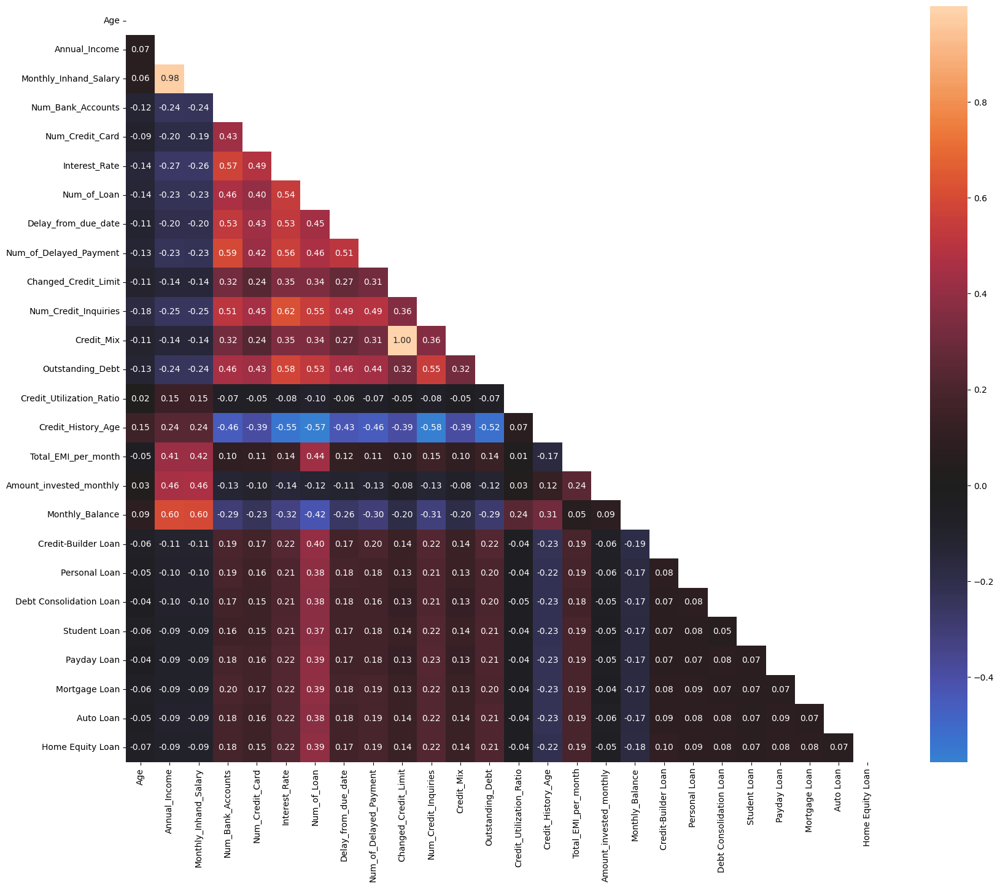

In [49]:
df_heat=df.drop(columns=df.select_dtypes('object').columns[1:])
corr =  df_heat.corr()

# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(20,16))
sns.heatmap(corr, mask=mask, center=0, annot=True,
            fmt='.2f', square=True)

In [ ]:
df_heat=df.drop(columns=df.select_dtypes('object').columns[1:])
corr =  df_heat.corr(method="spearman")

# Create a mask
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(20,16))
sns.heatmap(corr, mask=mask, center=0, annot=True,
            fmt='.2f', square=True,)

In [51]:
df.drop(columns=["Monthly_Inhand_Salary","Customer_ID"],inplace=True)


# Modeling

In [52]:
df.select_dtypes("object").columns

Index(['Month', 'Occupation', 'Payment_of_Min_Amount', 'Payment_Behaviour',
       'Credit_Score'],
      dtype='object')

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 30 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  object 
 1   Age                       100000 non-null  int64  
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Num_Bank_Accounts         100000 non-null  int64  
 5   Num_Credit_Card           100000 non-null  int64  
 6   Interest_Rate             100000 non-null  int64  
 7   Num_of_Loan               100000 non-null  float64
 8   Delay_from_due_date       100000 non-null  int64  
 9   Num_of_Delayed_Payment    100000 non-null  float64
 10  Changed_Credit_Limit      100000 non-null  float64
 11  Num_Credit_Inquiries      100000 non-null  float64
 12  Credit_Mix                100000 non-null  float64
 13  Outstanding_Debt          100000 non-null  fl

In [54]:
for column in df.columns[22:]:
    df[column]=np.where(df[column]==True,1,0)

In [55]:
df=pd.get_dummies(df,columns=["Occupation","Payment_Behaviour",'Month'])

In [56]:
encoding_map = {'Poor': 0, 'Standard': 1, 'Good': 2}
df['Credit_Score'] = df['Credit_Score'].replace(encoding_map)
encoding_map = {'No': 0, 'NM': 1, 'Yes': 2}
df['Payment_of_Min_Amount'] = df['Payment_of_Min_Amount'].replace(encoding_map)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 56 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Age                                                 100000 non-null  int64  
 1   Annual_Income                                       100000 non-null  float64
 2   Num_Bank_Accounts                                   100000 non-null  int64  
 3   Num_Credit_Card                                     100000 non-null  int64  
 4   Interest_Rate                                       100000 non-null  int64  
 5   Num_of_Loan                                         100000 non-null  float64
 6   Delay_from_due_date                                 100000 non-null  int64  
 7   Num_of_Delayed_Payment                              100000 non-null  float64
 8   Changed_Credit_Limit                                100000 non-nu

In [57]:
%pip install imblearn

In [58]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.regularizers import l2


X=df.drop(columns="Credit_Score")
y=df["Credit_Score"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

sampler = SMOTE(sampling_strategy='auto', random_state=42)

X_train, y_train = sampler.fit_resample(X_train, y_train)

# Standardize the feature data (you can use other scalers as needed)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

norm = Normalizer()
X_train = norm.fit_transform(X_train)
X_test = norm.transform(X_test)



# # Define your model

model = keras.Sequential([
    layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    layers.BatchNormalization(),
    layers.Dropout(0.1),  # Adding dropout for regularization

    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),

    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),

    layers.Dense(64, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),

    layers.Dense(3, activation='softmax')
])


from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, BatchNormalization, Dropout



# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)
early_stopping = EarlyStopping(monitor='val_loss', patience=5,restore_best_weights=True)
model.fit(X_train, y_train, epochs=20, validation_split=0.20, callbacks=[reduce_lr,early_stopping],batch_size=128)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

# Make predictions
predictions = model.predict(X_test)

# If you want to decode the predictions back to original labels:
# decoded_predictions = label_encoder.inverse_transform(np.argmax(predictions, axis=1))



Epoch 1/20
799/799 [==============================] - 16s 16ms/step - loss: 0.6752 - accuracy: 0.6915 - val_loss: 0.9603 - val_accuracy: 0.4819 - lr: 0.0010
Epoch 2/20
799/799 [==============================] - 13s 17ms/step - loss: 0.6024 - accuracy: 0.7189 - val_loss: 0.8790 - val_accuracy: 0.5450 - lr: 0.0010
Epoch 3/20
799/799 [==============================] - 13s 17ms/step - loss: 0.5834 - accuracy: 0.7281 - val_loss: 0.8052 - val_accuracy: 0.6089 - lr: 0.0010
Epoch 4/20
799/799 [==============================] - 13s 17ms/step - loss: 0.5703 - accuracy: 0.7342 - val_loss: 0.8163 - val_accuracy: 0.6000 - lr: 0.0010
Epoch 5/20
799/799 [==============================] - 13s 16ms/step - loss: 0.5552 - accuracy: 0.7388 - val_loss: 0.8506 - val_accuracy: 0.5437 - lr: 0.0010
Epoch 6/20
799/799 [==============================] - 13s 16ms/step - loss: 0.5406 - accuracy: 0.7466 - val_loss: 0.7400 - val_accuracy: 0.6425 - lr: 0.0010
Epoch 7/20
799/799 [==============================] - 15s 

In [59]:
X=df.drop(columns="Credit_Score")
y=df["Credit_Score"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

sampler = SMOTE(sampling_strategy='auto', random_state=42)

X_train, y_train = sampler.fit_resample(X_train, y_train)

In [60]:
%pip install pycaret

In [61]:
from pycaret.classification import *

In [ ]:
s = setup(X_train, target = y_train,train_size=0.8,feature_selection_estimator=True,feature_selection_method='sequential')

In [63]:
best_model = compare_models(errors='raise',n_select=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,21:15:39
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Extreme Gradient Boosting


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8226,0.9481,0.8226,0.8220,0.8212,0.7339,0.7348,34.6570
et,Extra Trees Classifier,0.8208,0.9492,0.8208,0.8203,0.8202,0.7312,0.7314,28.7650
knn,K Neighbors Classifier,0.7975,0.9147,0.7975,0.7981,0.7895,0.6962,0.7030,15.4940
gbc,Gradient Boosting Classifier,0.7584,0.9099,0.7584,0.7585,0.7577,0.6376,0.6383,130.5800
lda,Linear Discriminant Analysis,0.7294,0.8822,0.7294,0.7327,0.7294,0.5940,0.5953,1.5810
ridge,Ridge Classifier,0.7275,0.0000,0.7275,0.7303,0.7272,0.5912,0.5925,0.3010
ada,Ada Boost Classifier,0.7190,0.8647,0.7190,0.7204,0.7186,0.5785,0.5794,9.4210
dt,Decision Tree Classifier,0.7168,0.7876,0.7168,0.7165,0.7166,0.5752,0.5752,3.0460
nb,Naive Bayes,0.6492,0.7948,0.6492,0.6745,0.6184,0.4739,0.5026,0.7200
lr,Logistic Regression,0.6463,0.7810,0.6463,0.6434,0.6409,0.4695,0.4726,31.5030


Processing:   0%|          | 0/67 [00:00<?, ?it/s]

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8226,0.9481,0.8226,0.8220,0.8212,0.7339,0.7348,34.6570
et,Extra Trees Classifier,0.8208,0.9492,0.8208,0.8203,0.8202,0.7312,0.7314,28.7650
xgboost,Extreme Gradient Boosting,0.8062,0.9430,0.8062,0.8074,0.8064,0.7093,0.7097,111.8500
knn,K Neighbors Classifier,0.7975,0.9147,0.7975,0.7981,0.7895,0.6962,0.7030,15.4940
lightgbm,Light Gradient Boosting Machine,0.7927,0.9359,0.7927,0.7945,0.7928,0.6890,0.6896,15.5810
gbc,Gradient Boosting Classifier,0.7584,0.9099,0.7584,0.7585,0.7577,0.6376,0.6383,130.5800
lda,Linear Discriminant Analysis,0.7294,0.8822,0.7294,0.7327,0.7294,0.5940,0.5953,1.5810
ridge,Ridge Classifier,0.7275,0.0000,0.7275,0.7303,0.7272,0.5912,0.5925,0.3010
ada,Ada Boost Classifier,0.7190,0.8647,0.7190,0.7204,0.7186,0.5785,0.5794,9.4210
dt,Decision Tree Classifier,0.7168,0.7876,0.7168,0.7165,0.7166,0.5752,0.5752,3.0460


In [64]:
blender=blend_models(best_model,fold=10,choose_better=True)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,22:27:54
Status,. . . . . . . . . . . . . . . . . .,Compiling Final Results
Estimator,. . . . . . . . . . . . . . . . . .,Voting Classifier


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8298,0.9530,0.8298,0.8296,0.8294,0.7447,0.7450
1,0.8279,0.9526,0.8279,0.8274,0.8273,0.7418,0.7421
2,0.8245,0.9518,0.8245,0.8242,0.8241,0.7368,0.7371
3,0.8212,0.9515,0.8212,0.8205,0.8205,0.7318,0.7321
4,0.8235,0.9517,0.8235,0.8229,0.8228,0.7353,0.7357
5,0.8251,0.9521,0.8251,0.8246,0.8245,0.7377,0.7380
6,0.8198,0.9504,0.8198,0.8193,0.8193,0.7297,0.7300
7,0.8314,0.9548,0.8314,0.8313,0.8312,0.7471,0.7472
8,0.8241,0.9525,0.8241,0.8238,0.8236,0.7362,0.7365
